In [1]:
include("./trajopt/utils.jl")
include("./trajopt/dynamics.jl")
include("./funlopt/funl_dynamics.jl")
include("./funlopt/funl_utils.jl")
include("./funlopt/funl_constraint.jl")
include("./funlopt/funl_synthesis.jl")
include("./trajopt/scaling.jl")
# Set default plot settings for academic paper
using LaTeXStrings
default(
    guidefont = font(12, "Times"),      # Axis label font
    legendfont = font(12, "Times"),     # Legend font
    titlefont = font(14, "Times"),      # Title font
    tickfont = font(10, "sans-serif"),  # Tick font
    grid = true                         # Enable grid lines
)

In [2]:
# load nominal trajectory
using JLD2, FileIO
filename = "./data/traj_result" 
@load filename my_dict
xnom = my_dict["x"]
unom = my_dict["u"]
tnom = my_dict["t"];
N = size(xnom,2) - 1
dtnom = zeros(N)
for i in 1:N
    dtnom[i] = tnom[i+1]-tnom[i]
end

In [3]:
filename = "./data/funnel_result_unicycle" 
@load filename funl_dict
beta = funl_dict["beta"]
gamma = funl_dict["gamma"]

Q_m1 = funl_dict["Q_m1"]
Y_m1 = funl_dict["Y_m1"]
lam_m1 = funl_dict["lam_m1"];

list_lambda_w = funl_dict["list_lambda_w"]

Q0 = funl_dict["Q0"]
Y0 = funl_dict["Y0"]
lam0 = funl_dict["lam0"];

Q1 = funl_dict["Q1"]
Y1 = funl_dict["Y1"]
lam1 = funl_dict["lam1"];
cost_lambda_w1 = funl_dict["cost_lambda_w1"]
list_solve_time1 = funl_dict["list_solve_time1"]

Q2 = funl_dict["Q2"]
Y2 = funl_dict["Y2"]
lam2 = funl_dict["lam2"];
cost_lambda_w2 = funl_dict["cost_lambda_w2"]
list_solve_time2 = funl_dict["list_solve_time2"]

N1 = size(Q2,3) - 1
@assert(N == N1)

In [4]:
# obstacle
function get_H_obs(rx,ry)
    return diagm([1/rx,1/ry])
end
c_list = []
H_list = []
push!(c_list, [4.0, 2.5])
push!(H_list, get_H_obs(1.5, 4.0))
vmax = 2.0
vmin = 0.0
wmax = 1.5
wmin = -1.5

-1.5

In [5]:
ix = 3
iu = 2
iw = 2
dynamics = Unicycle()
A = zeros(ix,ix,N+1)
B = zeros(ix,iu,N+1)
F = zeros(ix,iw,N+1)
for idx in 1:N+1
    A[:,:,idx],B[:,:,idx],F[:,:,idx] = diff_ABF(dynamics,xnom[:,idx],unom[:,idx])
end
u_fit = [LinearInterpolation(tnom, unom[idx,:],extrapolation_bc=Flat()) for idx in 1:iu]
A_fit = [[LinearInterpolation(tnom, A[i,j,:], extrapolation_bc=Flat()) for j in 1:ix] for i in 1:ix ]
B_fit = [[LinearInterpolation(tnom, B[i,j,:], extrapolation_bc=Flat()) for j in 1:iu] for i in 1:ix ]
F_fit = [[LinearInterpolation(tnom, F[i,j,:], extrapolation_bc=Flat()) for j in 1:iw] for i in 1:ix ];

# Get intersample trajectory and funnel

In [6]:
_,tprop,xprop = propagate_multiple_FOH(dynamics,xnom,unom,dtnom)

([0.0 0.45605368080255704 … 7.543918847423386 7.999993611648152; 0.0 0.1605354886837394 … 0.1605164627036123 -1.0684492663686693e-5; 0.0 0.5953215826720322 … -0.5953218635605422 4.223148254129642e-12], [0.0, 7.5e-5, 0.0008249999999999999, 0.008324999999999997, 0.03085414548416754, 0.06215007456684899, 0.09902516271982972, 0.1431291980573401, 0.19272734644366651, 0.24779065423393856  …  14.421288051427327, 14.472154433102574, 14.52771957685547, 14.587791492049384, 14.651841714168432, 14.71964593442123, 14.790969551725798, 14.86574980331131, 14.94401864182967, 15.0], [0.0 2.154783087656023e-5 … 7.982385727014699 7.999993611648152; 0.0 5.444496487902496e-10 … 0.00033411064021220225 -1.0684492663686693e-5; 0.0 5.053220924921486e-5 … -0.03821899076969245 4.223148254129642e-12])

In [7]:
Q_fit = [[LinearInterpolation(tnom, Q2[i,j,:], extrapolation_bc=Flat()) for j in 1:ix] for i in 1:ix ]
Y_fit = [[LinearInterpolation(tnom, Y2[i,j,:], extrapolation_bc=Flat()) for j in 1:ix] for i in 1:iu ]
u_fit = [LinearInterpolation(tnom, unom[idx,:],extrapolation_bc=Flat()) for idx in 1:iu]
;

In [8]:
# tplot = LinRange(tnom[1],tnom[end],201)
length_tprop = length(tprop)
Qprop = zeros(ix,ix,length_tprop)
Yprop = zeros(iu,ix,length_tprop)
uprop = zeros(iu,length_tprop)
# Qplot,Yplot = [],[]
for (idx,t) in enumerate(tprop)
    Qprop[:,:,idx] .= get_ABF_interp(t,Q_fit,ix,ix) 
    Yprop[:,:,idx] .= get_ABF_interp(t,Y_fit,iu,ix) 
    uprop[:,idx] .= get_u_interp(t,u_fit)
    # push!(Qplot,)
    # push!(Yplot,get_ABF_interp(t,Y_fit,iu,ix))
end

In [9]:
input_proj_funl_nom,Rnom = project_onto_input(Q2,Y2)
input_proj_funl_prop,Rprop = project_onto_input(Qprop,Yprop)

(Any[Any[0.28726482765091094, 0.2873235261554796, 0.28791069624311383, 0.29380007916619477, 0.31165409391383697, 0.3367356728064442, 0.3664972974543572, 0.40214050838731735, 0.4420487099642048, 0.4859449730833185  …  0.6838597217140987, 0.6253198148044167, 0.569889802073821, 0.5176284293983655, 0.46870639803513187, 0.42294543967619075, 0.3802325133274481, 0.3406086899063916, 0.3051883083454035, 0.2872737494456056], Any[0.8256508175894454, 0.8256132870964132, 0.8252380827552452, 0.8214960564709411, 0.8103633328362129, 0.7951597014391362, 0.7776210652472932, 0.7571573418962225, 0.7347916981714145, 0.7107535474101853  …  0.49731317854230256, 0.4812496454359003, 0.46866283434362843, 0.46093808392871066, 0.4598767753320405, 0.4680779898102433, 0.4902348736575661, 0.5370238736031213, 0.6419366300131121, 0.8261594243803897]], [0.08252108120530757 -3.9008800228576284e-5; -3.900880022859515e-5 0.6816992725861196;;; 0.08255480868241857 -1.504799627122341e-5; -1.5047996271251142e-5 0.681637299830

# Computed funnel

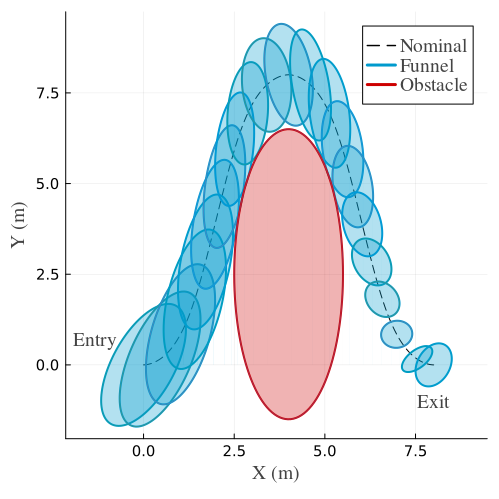

In [10]:
p2 = Plots.plot(; size=(500,500))
plot!(xprop[1,:],xprop[2,:],aspect_ratio=:equal,c=:black,linestyle=:dash,linewidth=1.0,label="Nominal")
for idx in 1:N+1
    label = nothing
    if idx == 1
        label = "Funnel"
    end
    plot_ellipse(p2,Q2[:,:,idx],xnom[:,idx],"deepskyblue3",label=label,idx1=1,idx2=2)
end
for (idx,(ce, H)) in enumerate(zip(c_list, H_list))
    label = nothing
    if idx == 1
        label = "Obstacle"
    end
    plot_ellipse(p2,inv(H)*inv(H),ce,"red3",label=label)
end
annotate!(-1.3,0.7,text("Entry", :black, 12, "Times"))
annotate!(8.0,-1.0,text("Exit", :black, 12, "Times"))
xlabel!("X (m)")
ylabel!("Y (m)")
display(p2)
# savefig("./image/unicycle_funnels_onto_xy.pdf")

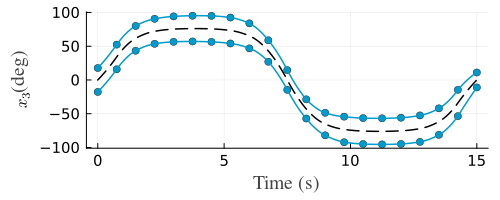

In [11]:
using LaTeXStrings
lW = 1.5
p3 = Plots.plot(; size=(500,200))
# plot!(tsam[1],xnomprop[1][3,:],linestyle=:dash,color="black",label="")
plot!(tprop,rad2deg.(xprop[3,:]),linewidth=lW,linestyle=:dash,color="black",label="")
scatter!(tnom,rad2deg.(xnom[3,:] + sqrt.(Q2[3,3,:])),linewidth=lW,seriestype = :line, marker = :circle,color="deepskyblue3",label="")
scatter!(tnom,rad2deg.(xnom[3,:] - sqrt.(Q2[3,3,:])),linewidth=lW,seriestype = :line, marker = :circle,color="deepskyblue3",label="")
plot!(tprop,rad2deg.(xprop[3,:] + sqrt.(Qprop[3,3,:])),linewidth=lW,seriestype = :line,color="deepskyblue3",label="")
plot!(tprop,rad2deg.(xprop[3,:] - sqrt.(Qprop[3,3,:])),linewidth=lW,seriestype = :line,color="deepskyblue3",label="")
xlabel!("Time (s)")
ylabel!(L"x_3" * "(deg)")
plot!(bottom_margin=5Plots.mm)
plot!(left_margin=5Plots.mm)
# savefig("./image/unicycle_yaw_funnels.pdf")
display(p3)

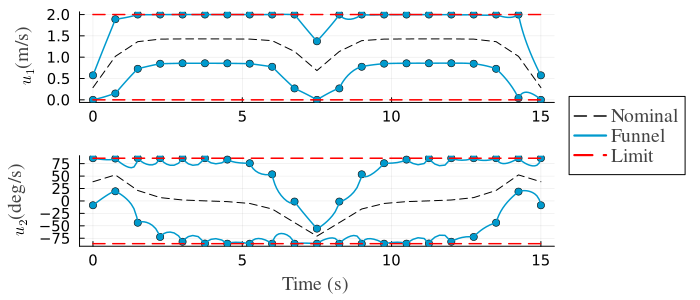

In [12]:
lW = 1.5
p1 = plot(tnom,unom[1,:],linestyle=:dash,linewidth=1,color="black",label="Nominal")
scatter!(tnom,unom[1,:]+input_proj_funl_nom[1],linewidth=lW,color="deepskyblue3",label="")
scatter!(tnom,unom[1,:]-input_proj_funl_nom[1],linewidth=lW,color="deepskyblue3",label="")
plot!(tprop,uprop[1,:]+input_proj_funl_prop[1],linewidth=lW,color="deepskyblue3",label="")
plot!(tprop,uprop[1,:]-input_proj_funl_prop[1],linewidth=lW,color="deepskyblue3",label="Funnel")
plot!(tnom,tnom*0 .+ vmax,linewidth=lW,linestyle=:dash,color="red",label="Limit")
plot!(tnom,tnom*0 .+ vmin,linewidth=lW,linestyle=:dash,color="red",label="")
ylabel!(raw"$u_1$" * "(m/s)")
p2 = plot(tnom,rad2deg.(unom[2,:]),linewidth=1,linestyle=:dash,color="black",label="")
scatter!(tnom,rad2deg.(unom[2,:]+input_proj_funl_nom[2]),linewidth=lW,color="deepskyblue3",label="")
scatter!(tnom,rad2deg.(unom[2,:]-input_proj_funl_nom[2]),linewidth=lW,color="deepskyblue3",label="")
plot!(tprop,rad2deg.(uprop[2,:]+input_proj_funl_prop[2]),linewidth=lW,color="deepskyblue3",label="")
plot!(tprop,rad2deg.(uprop[2,:]-input_proj_funl_prop[2]),linewidth=lW,color="deepskyblue3",label="")
plot!(tnom,tnom*0 .+ rad2deg(wmax),linewidth=lW,linestyle=:dash,color="red",label="")
plot!(tnom,tnom*0 .+ rad2deg(wmin),linewidth=lW,linestyle=:dash,color="red",label="")
xlabel!("Time (s)")
ylabel!(L"u_2" * "(deg/s)")
p3 = plot(p1,p2,layout=(2,1),size=(700,300))
plot!(legend=(1.12,-0.15))
plot!(bottom_margin=5Plots.mm)
plot!(left_margin=5Plots.mm)
plot!(right_margin=35Plots.mm)
# savefig("./image/unicycle_input_funnels.pdf")
display(p3)

# Samples

In [13]:
num_sample = 100
xs_list = []
Random.seed!(1234)
for i in 1:num_sample
    z = randn(ix)
    z = z / norm(z)
    push!(xs_list,xnom[:,1] + sqrt(Q2[:,:,1]) * z)
end

In [14]:
xsam_fwd,tsam,xsam,usam,xnomprop = [],[],[],[],[]
i = 0
for xs in xs_list
    # println(i)
    i += 1
    xf_,ts_,xsam_,usam_,xnom_ = propagate_from_funnel_entry_uncertain_dynamics(xs,
        dynamics,
        xnom,unom,tnom,
        Q2,Y2)
    push!(xsam_fwd,xf_)
    push!(tsam,ts_)
    push!(xsam,xsam_)
    push!(usam,usam_)
    push!(xnomprop,xnom_)
end

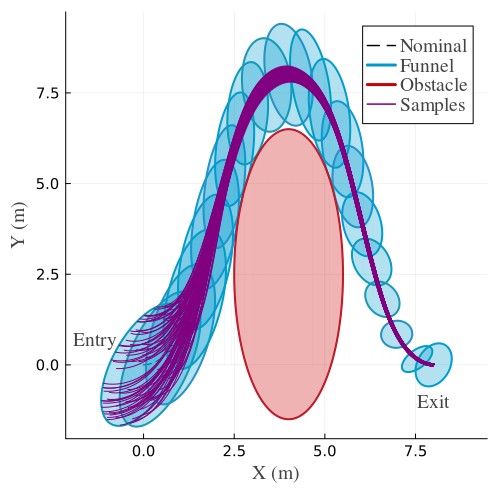

In [15]:
p2 = Plots.plot(; size=(500,500))
plot!(xprop[1,:],xprop[2,:],aspect_ratio=:equal,c=:black,linestyle=:dash,linewidth=1.0,label="Nominal")
for idx in 1:N+1
    label = nothing
    if idx == 1
        label = "Funnel"
    end
    plot_ellipse(p2,Q2[:,:,idx],xnom[:,idx],"deepskyblue3",label=label,idx1=1,idx2=2)
end
for (idx,(ce, H)) in enumerate(zip(c_list, H_list))
    label = nothing
    if idx == 1
        label = "Obstacle"
    end
    plot_ellipse(p2,inv(H)*inv(H),ce,"red3",label=label,idx1=1,idx2=2)
end
for (idx,x_) in enumerate(xsam)
    label = ""
    if idx == 1
        label ="Samples"
    end
    plot!(x_[1,:],x_[2,:],color="purple",label=label)
end
annotate!(-1.3,0.7,text("Entry", :black, 12, "Times"))
annotate!(8.0,-1.0,text("Exit", :black, 12, "Times"))
xlabel!("X (m)")
ylabel!("Y (m)")
display(p2)
# savefig("./image/unicycle_funnels_with_samples.pdf")

In [16]:
# Lyapunov function
Lypsam = []
idx = 1
for idx = 1:length(tsam)
    tsam_ = tsam[idx]
    xsam_ = xsam[idx]
    xprop_ = xnomprop[idx]
    Lyp = []
    for iode in 1:length(tsam_)
        t_ = tsam_[iode]
        x_ = xsam_[:,iode]
        xnom_ = xprop_[:,iode]
        Q_ = get_ABF_interp(t_,Q_fit,ix,ix)
        val = (x_ - xnom_)' * inv(Q_) * (x_ - xnom_)
        push!(Lyp,val)
    end
    push!(Lypsam,Lyp)
end


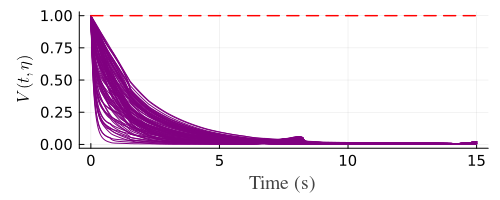

In [17]:
p3 = Plots.plot(; size=(500,200))
for idx = 1:length(tsam)
    plot!(tsam[idx],Lypsam[idx],c=:purple,label="")
end
plot!(tsam[1],tsam[1]*0 .+ 1.0,linewidth=lW,c=:red,linestyle=:dash,label="")
xlabel!("Time (s)")
ylabel!(L"V(t,\eta)")
plot!(bottom_margin=5Plots.mm)
plot!(left_margin=5Plots.mm)
# savefig("./image/unicycle_Lyapunov_proposed.pdf")
display(p3)

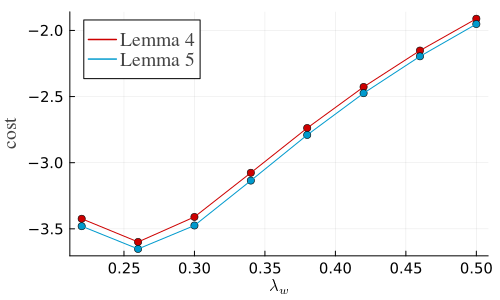

In [18]:
p4 = Plots.plot(; size=(500,300))
# scatter!(tnom,rad2deg.(xnom[3,:] + sqrt.(Q2[3,3,:])),linewidth=lW,seriestype = :line, marker = :circle,color="deepskyblue3",label="")
scatter!(list_lambda_w[4:end],cost_lambda_w1[4:end],seriestype =:line, marker=:circle,color="red3",label=nothing)
plot!(list_lambda_w[4:end],cost_lambda_w1[4:end],color="red3",label="Lemma 4")
scatter!(list_lambda_w[4:end],cost_lambda_w2[4:end],seriestype =:line, marker=:circle,color="deepskyblue3",label=nothing)
plot!(list_lambda_w[4:end],cost_lambda_w2[4:end],color="deepskyblue3",label="Lemma 5")
xlabel!(L"\lambda_w")
ylabel!("cost")
# savefig("./image/unicycle_lambda_w_comparison.pdf")
display(p4)

# Comparison with baseline

In [19]:
Q_test = Q_m1
Y_test = Y_m1
lam_test = lam_m1
Q_test_fit = [[LinearInterpolation(tnom, Q_test[i,j,:], extrapolation_bc=Flat()) for j in 1:ix] for i in 1:ix ]
Y_test_fit = [[LinearInterpolation(tnom, Y_test[i,j,:], extrapolation_bc=Flat()) for j in 1:ix] for i in 1:iu ]
lam_test_fit = [LinearInterpolation(tnom, lam_test[idx,:],extrapolation_bc=Flat()) for idx in 1:size(lam_m1,1)]

Q_test_prop = zeros(ix,ix,length_tprop)
Y_test_prop = zeros(iu,ix,length_tprop)
for (idx,t) in enumerate(tprop)
    Q_test_prop[:,:,idx] .= get_ABF_interp(t,Q_test_fit,ix,ix) 
    Y_test_prop[:,:,idx] .= get_ABF_interp(t,Y_test_fit,iu,ix) 
end
;

In [20]:
xsam_fwd,tsam,xsam,usam,xnomprop = [],[],[],[],[]
i = 0
for xs in xs_list
    # println(i)
    i += 1
    xf_,ts_,xsam_,usam_,xnom_ = propagate_from_funnel_entry_uncertain_dynamics(xs,
        dynamics,
        xnom,unom,tnom,
        Q_test,Y_test)
    push!(xsam_fwd,xf_)
    push!(tsam,ts_)
    push!(xsam,xsam_)
    push!(usam,usam_)
    push!(xnomprop,xnom_)
end

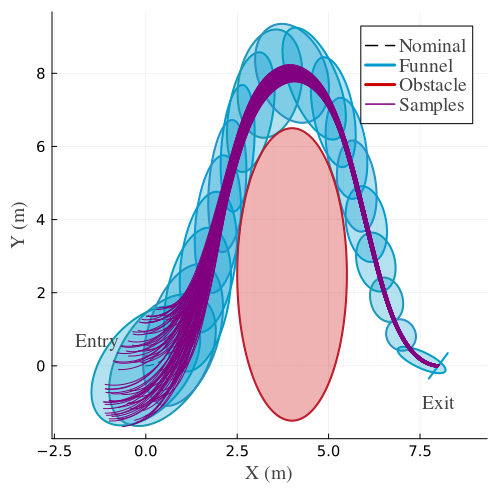

In [21]:
p2 = Plots.plot(; size=(500,500))
plot!(xprop[1,:],xprop[2,:],aspect_ratio=:equal,c=:black,linestyle=:dash,linewidth=1.0,label="Nominal")
for idx in 1:N+1
    label = nothing
    if idx == 1
        label = "Funnel"
    end
    plot_ellipse(p2,Q_test[:,:,idx],xnom[:,idx],"deepskyblue3",label=label,idx1=1,idx2=2)
end
for (idx,(ce, H)) in enumerate(zip(c_list, H_list))
    label = nothing
    if idx == 1
        label = "Obstacle"
    end
    plot_ellipse(p2,inv(H)*inv(H),ce,"red3",label=label,idx1=1,idx2=2)
end
for (idx,x_) in enumerate(xsam)
    label = ""
    if idx == 1
        label ="Samples"
    end
    plot!(x_[1,:],x_[2,:],color="purple",label=label)
end
annotate!(-1.3,0.7,text("Entry", :black, 12, "Times"))
annotate!(8.0,-1.0,text("Exit", :black, 12, "Times"))
xlabel!("X (m)")
ylabel!("Y (m)")
display(p2)

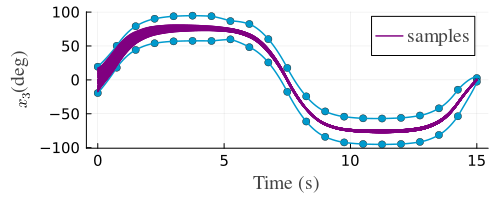

In [22]:
lW = 1.5
p3 = Plots.plot(; size=(500,200))
plot!(tprop,rad2deg.(xprop[3,:]),linewidth=lW,linestyle=:dash,color="black",label="")
scatter!(tnom,rad2deg.(xnom[3,:] + sqrt.(Q_test[3,3,:])),linewidth=lW,seriestype = :line, marker = :circle,color="deepskyblue3",label="")
scatter!(tnom,rad2deg.(xnom[3,:] - sqrt.(Q_test[3,3,:])),linewidth=lW,seriestype = :line, marker = :circle,color="deepskyblue3",label="")
plot!(tprop,rad2deg.(xprop[3,:] + sqrt.(Q_test_prop[3,3,:])),linewidth=lW,seriestype = :line,color="deepskyblue3",label="")
plot!(tprop,rad2deg.(xprop[3,:] - sqrt.(Q_test_prop[3,3,:])),linewidth=lW,seriestype = :line,color="deepskyblue3",label="")
for (idx,(t_,x_)) in enumerate(zip(tsam,xsam))
    label = ""
    if idx == 1
        label ="samples"
    end
    plot!(t_,rad2deg.(x_[3,:]),color="purple",label=label)
end
xlabel!("Time (s)")
ylabel!(L"x_3" * "(deg)")
plot!(bottom_margin=5Plots.mm)
plot!(left_margin=5Plots.mm)
display(p3)

In [23]:
# Lyapunov function
Lypsam = []
idx = 1
for idx = 1:length(tsam)
    tsam_ = tsam[idx]
    xsam_ = xsam[idx]
    xprop_ = xnomprop[idx]
    Lyp = []
    for iode in 1:length(tsam_)
        t_ = tsam_[iode]
        x_ = xsam_[:,iode]
        xnom_ = xprop_[:,iode]
        Q_ = get_ABF_interp(t_,Q_test_fit,ix,ix)
        val = (x_ - xnom_)' * inv(Q_) * (x_ - xnom_)
        push!(Lyp,val)
    end
    push!(Lypsam,Lyp)
end


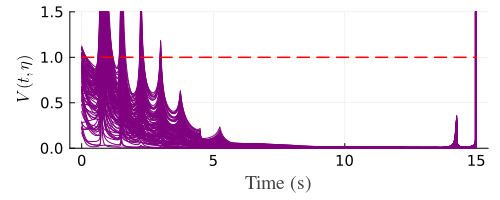

In [24]:
p3 = Plots.plot(; size=(500,200))
for idx = 1:length(tsam)
    plot!(tsam[idx],Lypsam[idx],c=:purple,label="")
end
plot!(tsam[1],tsam[1]*0 .+ 1.0,linewidth=lW,c=:red,linestyle=:dash,label="")
# scatter!(tnom,tnom*0 .+ 1.0,linewidth=lW,c=:red,linestyle=:dash,label="")
xlabel!("Time (s)")
ylabel!(L"V(t,\eta)")
plot!(bottom_margin=5Plots.mm)
plot!(left_margin=5Plots.mm)
ylims!(p3, 0.0, 1.5)
# savefig("./image/unicycle_Lyapunov_baseline.pdf")
display(p3)

In [25]:
lambda_w = 0.26

0.26

In [26]:
# Check DLMI
C1 = [0 0 1;0 0 1;0 0 0;0 0 0;0 0 0;0 0 0]
D1 = [0 0;0 0;1 0;1 0;0 0;0 0]
G1 = [0 0;0 0;0 0;0 0;1 0;1 0]
E1 = [1 0 1 0 1 0;0 1 0 1 0 1;0 0 0 0 0 0]

dynamics.C = [C1;dynamics.Co]
dynamics.D = [D1;dynamics.Do]
dynamics.E = [E1 dynamics.Eo]
dynamics.G = [G1;dynamics.Go];

function get_H_t(t_eval,dQ,beta,gamma,lambda_w,Q_test_fit,Y_test_fit,lam_test_fit)
    Q_t = get_ABF_interp(t_eval,Q_test_fit,ix,ix)
    Y_t = get_ABF_interp(t_eval,Y_test_fit,iu,ix)
    lam_t = get_vec_interp(t_eval,lam_test_fit,size(lam_m1,1))
    A_t = get_ABF_interp(t_eval,A_fit,ix,ix)
    B_t = get_ABF_interp(t_eval,B_fit,ix,iu)
    F_t = get_ABF_interp(t_eval,F_fit,ix,iu)

    gamma_sq = gamma^2
    beta_sq = beta^2

    W_t = A_t*Q_t + B_t*Y_t + Q_t*A_t' + Y_t'*B_t' + lambda_w * Q_t

    idelta = dynamics.idelta
    iq = dynamics.iq
    N1_11 = [diagm(lam_t[1:idelta])*1.0I(idelta) zeros(idelta,iq)]
    n = Int(iq ÷ 2)
    a = lam_t[idelta+1] * Matrix{Float64}(I, n, n)
    b = lam_t[idelta+2] * Matrix{Float64}(I, n, n)
    N1_22 = [zeros(n, idelta)  a  zeros(n, n);
        zeros(n, idelta)  zeros(n, n)  b]
    N1 = [N1_11;N1_22]
    iphi = dynamics.iphi
    N2_11 = [diagm(lam_t[1:idelta])*beta_sq*1.0I(idelta) zeros(idelta,iphi)]
    N2_22 = [zeros(iphi,idelta) diagm(lam_t[idelta+1:idelta+iphi])*gamma_sq*1.0I(iphi)]
    N2 = [N2_11;N2_22]

    LMI11 = W_t - dQ
    LMI21 = N2 * dynamics.E'
    LMI22 = - N2

    iw = dynamics.iw
    ip = dynamics.ip
    LMI31 = F_t'
    LMI32 = zeros(iw,ip)
    LMI33 = -lambda_w * 1.0I(iw)
    LMI43 = dynamics.G

    LMI41 = dynamics.C*Q_t + dynamics.D*Y_t
    LMI42 = zeros(dynamics.ir,dynamics.ip)
    LMI44 = - N1
    H_t = stack_LMI44(LMI11,LMI21,LMI31,LMI41,
            LMI22,LMI32,LMI42,
            LMI33,LMI43,
            LMI44)
    return H_t
end

function get_H(Q_test,Y_test,lam_test)
    Q_test_fit = [[LinearInterpolation(tnom, Q_test[i,j,:], extrapolation_bc=Flat()) for j in 1:ix] for i in 1:ix ]
    Y_test_fit = [[LinearInterpolation(tnom, Y_test[i,j,:], extrapolation_bc=Flat()) for j in 1:ix] for i in 1:iu ]
    lam_test_fit = [LinearInterpolation(tnom, lam_test[idx,:],extrapolation_bc=Flat()) for idx in 1:size(lam_m1,1)]

    H_prop = []
    t_prop = []
    for i in 1:N
        length_subinterval = 20
        for t in range(tnom[i], stop=tnom[i+1], length=length_subinterval)
            dQ = (Q_test[:,:,i+1] - Q_test[:,:,i]) / (tnom[i+1]-tnom[i])
            beta_t = beta[i]
            gamma_t = gamma[i]
            push!(H_prop, get_H_t(t,dQ,beta_t,gamma_t,lambda_w,Q_test_fit,Y_test_fit,lam_test_fit))
            push!(t_prop, t)
        end
    end

    max_lam_Hprop = zeros(length(H_prop))
    for i in 1:length(H_prop)
        eig_vals = eigen(H_prop[i]).values
        if i == 1
            println(eig_vals)
        end
        max_lam_Hprop[i] = eig_vals[end]
    end
    return t_prop,H_prop,max_lam_Hprop
end


get_H (generic function with 1 method)

In [27]:
t_m1,_,max_lam_H_m1 = get_H(Q_m1,Y_m1,lam_m1)
t_0,_,max_lam_H_0 = get_H(Q0,Y0,lam0)
t_2,_,max_lam_H_2 = get_H(Q2,Y2,lam2)

[-358.15481859686, -202.1334542429574, -50.120518573082926, -16.263120803899742, -16.21341255489749, -16.201959166366343, -9.26783508000701, -5.790311753855724, -5.65054671607076, -5.617735563495863, -1.840665739607338, -1.0595224269853012, -0.2760948609226177, -0.26691914434889885, -0.11192754882130855, -0.10102718773369142, -0.027915493581997148, -0.017915661926943487, -0.014288496990075032, -0.00971299028080024, -0.005309901919197096, -0.002597841822647123, -0.0016051833417260503, -3.397510414941961e-8, -1.3774622766149142e-8]
[-364.2583112391071, -201.95637567879072, -45.13055290907108, -16.034921156500072, -15.981892568017857, -15.974432408051602, -8.199864338470551, -5.809498341496482, -5.663011124185358, -5.6421693256862415, -3.2750361079519306, -1.837348459475383, -0.2751688237338312, -0.27150569302425515, -0.11101452198721652, -0.09535785246677243, -0.028848171214807063, -0.02329241011810107, -0.020081322924935568, -0.012283834906792015, -0.0050626511317398174, -0.002608100053

(Any[0.0, 0.039473684210526314, 0.07894736842105263, 0.11842105263157894, 0.15789473684210525, 0.19736842105263158, 0.23684210526315788, 0.27631578947368424, 0.3157894736842105, 0.35526315789473684  …  14.644736842105264, 14.68421052631579, 14.723684210526315, 14.763157894736842, 14.802631578947368, 14.842105263157896, 14.881578947368421, 14.921052631578947, 14.960526315789474, 15.0], Any[[-0.1464344660604066 -0.005413842338450728 … -0.33396092370354963 0.0; -0.005413842338450728 -0.21946315239159297 … -0.2673576879524369 0.0; … ; -0.33396092370354963 -0.2673576879524369 … -5.711204306049612 -0.0; 0.0 0.0 … -0.0 -5.711204306049612], [-0.2175115493895699 -0.0382132238774235 … -0.3674533108203584 0.0; -0.038213223877423555 -0.23648277125817552 … -0.30377890468783253 0.0; … ; -0.3674533108203584 -0.30377890468783253 … -5.723702720237691 -0.0; 0.0 0.0 … -0.0 -5.723702720237691], [-0.2879484750414515 -0.07227599360100163 … -0.4009456979371672 0.0; -0.07227599360100163 -0.2573640421852228 … 

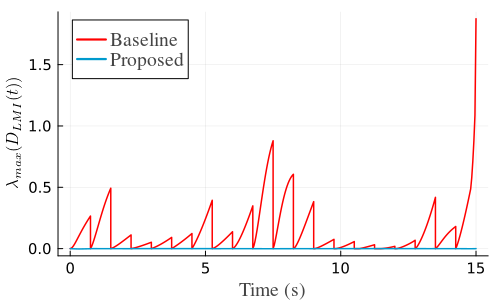

In [28]:
p1 = plot(t_m1,max_lam_H_m1,size=(500,300),linewidth=1.5,color="red",label="Baseline")
plot!(t_2,max_lam_H_2,size=(500,300),linewidth=1.5,color="deepskyblue3",label="Proposed")
xlabel!("Time (s)")
ylabel!(L"\lambda_{max}(D_{LMI}(t))")
# savefig("./image/unicycle_DLMI_comparison_baseline.pdf")
display(p1)

In [ ]:
p1 = plot(t_0,max_lam_H_0,size=(500,300),linewidth=1.5,color="green",label="Baseline")
plot!(t_2,max_lam_H_2,size=(500,300),linewidth=1.5,color="deepskyblue3",label="Proposed")
xlabel!("Time (s)")
ylabel!(L"\lambda_{max}(D_{LMI}(t))")